# YOLO26l-OBB — Object Counting & Tracking
**Model:** `yolo26l-obb` fine-tuned on VisDrone (classes: `human`, `car`)  
**Tracker:** BoT-SORT (ByteTrack-based, best for dense aerial scenes)  

### What this notebook covers
| Mode | Task |
|---|---|
| **Image** | Count people, cars, total objects per image |
| **Video** | Track people (BoT-SORT ID), count cars (no ID needed), display per-frame + whole-video totals |

In [1]:
import os
from pathlib import Path
os.chdir(Path(os.getcwd()).parent)

print(f'Current working directory: {os.getcwd()}')

Current working directory: d:\Programing\drone-human-detection-and-counting-system


****
# Imports

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

import supervision as sv
from ultralytics import YOLO
from IPython.display import display, Image as IPImage

*****
# Configs

In [3]:
try:
    from google.colab.patches import cv2_imshow as _cv2_imshow
    IS_COLAB = True
    print("[Env] Google Colab detected — using cv2_imshow patch.")
    print("[Env] DISPLAY_MODE auto-set to 'inline'.")
except ImportError:
    IS_COLAB = False
    _cv2_imshow = None
    print("[Env] Local environment — cv2.imshow() available.")

def show_frame(frame: 'np.ndarray', window_name: str = "") -> None:
    """
    Unified display helper.
    • Colab  → google.colab.patches.cv2_imshow (no window_name needed)
    • Local  → cv2.imshow with the given window_name
    """
    if IS_COLAB:
        _cv2_imshow(frame)
    else:
        cv2.imshow(window_name, frame)

[Env] Local environment — cv2.imshow() available.


In [4]:
MODEL_PATH = "models/model.pt"
IMAGE_PATH = "dataset/VisDrone_Dataset/VisDrone2019-DET-test-challenge/images/0000025_02891_d_0000004.jpg"
VIDEO_PATH = "samples/test_video_2.mp4"
OUTPUT_DIR = Path("outputs")
OUTPUT_DIR.mkdir(exist_ok=True)

CLASS_NAMES = {0: "human", 1: "car"}
HUMAN_ID    = 0
CAR_ID      = 1

CONF_THRESH = 0.20   # minimum confidence
IOU_NMS     = 0.4    # rotated NMS threshold
IMG_SIZE    = 1088   

# Display mode
# "window" → cv2.imshow live GUI window  (local Jupyter / VS Code only)
# "inline" → plt.show() every N frames   (Google Colab / headless server)
# "none"   → silent, no display at all
DISPLAY_MODE    = "inline"   # "window" = local cv2 GUI | "inline" = Colab/Jupyter | "none" = silent
if not IS_COLAB:
    print("[Config] DISPLAY_MODE 'window' is not supported on Colab — switching to 'inline'.")
    DISPLAY_MODE = "inline"
DISPLAY_EVERY_N = 30         # used only in "inline" mode
WINDOW_NAME     = "DroneTracker — BoT-SORT"

# ── supervision ColorPalette (replaces manual COLOUR dict) ───────────────────
# Index 0 → human (green), Index 1 → car (orange)
PALETTE = sv.ColorPalette.from_hex(["#00C800", "#FF7800"])

# Convenience: single colours for annotators
COLOR_HUMAN = sv.Color.from_hex("#00C800")
COLOR_CAR   = sv.Color.from_hex("#FF7800")

[Config] DISPLAY_MODE 'window' is not supported on Colab — switching to 'inline'.


In [5]:
pred_cfg = {
    "imgsz": IMG_SIZE,
    "conf": CONF_THRESH,
    "iou": IOU_NMS,
}

*****
# BoT-SORT algorithm

BoT-SORT (**Bo**x-**T**racking with **SORT** improvements) is the tracker used here. It builds on ByteTrack / DeepSORT with two key upgrades:

```
Per-frame detections
       │
       ▼
┌──────────────────────────────────────────────────────┐
│  1. KALMAN FILTER — predict each track's next position│
│     State vector: [x, y, w, h, vx, vy, vw, vh]       │
│     Predicts where each object SHOULD be this frame   │
└──────────────────────┬───────────────────────────────┘
                       │
                       ▼
┌──────────────────────────────────────────────────────┐
│  2. CAMERA MOTION COMPENSATION (CMC) — BoT-SORT only  │
│     Uses ECC / sparse optical flow to estimate global │
│     camera motion and warp Kalman predictions to      │
│     compensate for drone pan/tilt/zoom                │
└──────────────────────┬───────────────────────────────┘
                       │
                       ▼
┌──────────────────────────────────────────────────────┐
│  3. TWO-STAGE ASSOCIATION (ByteTrack strategy)        │
│     Stage A: high-conf detections ↔ active tracks     │
│              matched by IoU (Hungarian algorithm)     │
│     Stage B: low-conf detections ↔ unmatched tracks   │
│              rescues lost tracks from occlusion       │
└──────────────────────┬───────────────────────────────┘
                       │
                       ▼
┌──────────────────────────────────────────────────────┐
│  4. RE-ID EMBEDDING (optional, BoT-SORT only)         │
│     Deep appearance features compared with cosine     │
│     similarity to re-identify the same person after   │
│     long occlusion or re-entry into the frame         │
└──────────────────────┬───────────────────────────────┘
                       │
                       ▼
┌──────────────────────────────────────────────────────┐
│  5. TRACK LIFECYCLE MANAGEMENT                        │
│     NEW   → tentative (must confirm in N frames)      │
│     ACTIVE → confirmed, assigned stable integer ID    │
│     LOST  → kept in memory for max_age frames         │
│     DEAD  → removed, ID never reused                 │
└──────────────────────────────────────────────────────┘
```

Here the CMC step is critical — without it, a panning drone camera makes every stationary object look like it's moving, causing the Kalman filter predictions to drift and tracks to fragment.

*****
# Counter Wrapper

In [8]:
class ObjectCounter:
    """
    Wrapper for yolo-obb inference for single image.
        - handles model loading, preprocessing, postprocessing, and counting
        - designed for easy integration into tracking pipeline
        - can be extended with additional methods for visualization, etc.
    Uses supervision annotators instead of raw cv2 calls:
        - sv.OrientedBoxAnnotator  — draws thin OBB polygons per class color
        - sv.LabelAnnotator        — draws class + confidence labels (no bg fill)
        - custom cv2 panel         — draws the count summary panel (semi-transparent)
    """

    def __init__(self, model_path: str):
        self.model = YOLO(model_path)

        # Thin OBB lines only — no fill
        self.box_annotator = sv.OrientedBoxAnnotator(
            color=PALETTE,
            thickness=1,
        )

        # Small text, NO background fill, anchored tightly above box
        self.label_annotator = sv.LabelAnnotator(
            color=sv.Color.from_hex("#00000000"),   # fully transparent fill → no bg box
            text_color=sv.Color.from_hex("#00FFFF"), # cyan, matching target image
            text_scale=0.25,
            text_thickness=1,
            text_padding=1,
            text_position=sv.Position.TOP_CENTER,
        )

    def _make_labels(self, detections: sv.Detections):
        """Helper to create label strings for each detection, e.g. 'human 0.85'"""
        labels = []
        for id, conf in zip(detections.class_id, detections.confidence):
            name = CLASS_NAMES.get(id, "unknown")
            labels.append(f"{name} {conf:.2f}")
        return labels

    def _draw_count_panel(self, frame: np.ndarray, n_people: int, n_cars: int):
        """Draw a small semi-transparent dark panel in the top-left corner."""
        total = n_people + n_cars
        lines = [
            f"People : {n_people}",
            f"Cars   : {n_cars}",
            f"Total  : {total}",
        ]

        pad      = 10
        lh       = 22                          # line height (px)
        font     = cv2.FONT_HERSHEY_SIMPLEX
        fs       = 0.5                         # font scale  ← smaller than before
        thick    = 1

        text_sizes   = [cv2.getTextSize(l, font, fs, thick)[0] for l in lines]
        max_w        = max(w for w, _ in text_sizes)
        panel_w      = max_w + pad * 2
        panel_h      = lh * len(lines) + pad * 2

        # semi-transparent dark rectangle
        overlay = frame.copy()
        cv2.rectangle(overlay, (10, 10), (10 + panel_w, 10 + panel_h), (20, 20, 20), -1)
        cv2.addWeighted(overlay, 0.55, frame, 0.45, 0, frame)   # ~55 % opacity

        # grey-white text (not pure white) — matches target image tone
        text_color = (210, 210, 210)
        for i, line in enumerate(lines):
            y = 10 + pad + (i + 1) * lh
            cv2.putText(frame, line, (10 + pad, y), font, fs, text_color, thick, cv2.LINE_AA)

        return frame

    def __call__(
        self,
        image_path: str,
        cfg: dict,
        save_path: str = None,
        display: bool = True,
    ):
        """Run detection + counting on a single image."""
        frame = cv2.imread(image_path)
        if frame is None:
            raise FileNotFoundError(f"[Error] Failed to read image: {image_path}")

        results = self.model.predict(
            source=frame,
            imgsz=cfg.get("imgsz", IMG_SIZE),
            conf=cfg.get("conf", CONF_THRESH),
            iou=cfg.get("iou", IOU_NMS),
            verbose=False,
        )[0]

        # convert to supervision Detections
        detections = sv.Detections.from_ultralytics(results)

        # count by class using vectorised numpy operations
        n_people = int(np.sum(detections.class_id == HUMAN_ID)) if len(detections) else 0
        n_cars   = int(np.sum(detections.class_id == CAR_ID))   if len(detections) else 0

        # annotate — order matters: boxes first, labels on top
        labels = self._make_labels(detections)
        frame  = self.box_annotator.annotate(scene=frame, detections=detections)
        frame  = self.label_annotator.annotate(scene=frame, detections=detections, labels=labels)

        # draw counter panel last so it sits on top of everything
        frame = self._draw_count_panel(frame, n_people, n_cars)

        if save_path:
            cv2.imwrite(save_path, frame)
            print(f"[Info] Annotated image saved to: {save_path}")

        if display:
            rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(20, 12))
            plt.imshow(rgb)
            plt.axis("off")
            plt.title(
                f"People: {n_people} | Cars: {n_cars} | Total: {n_people + n_cars}",
                fontsize=16,
            )
            plt.tight_layout()
            plt.show()

        counts = {"people": n_people, "cars": n_cars, "total": n_people + n_cars}
        return counts

[Info] Annotated image saved to: outputs\counted_image.jpg


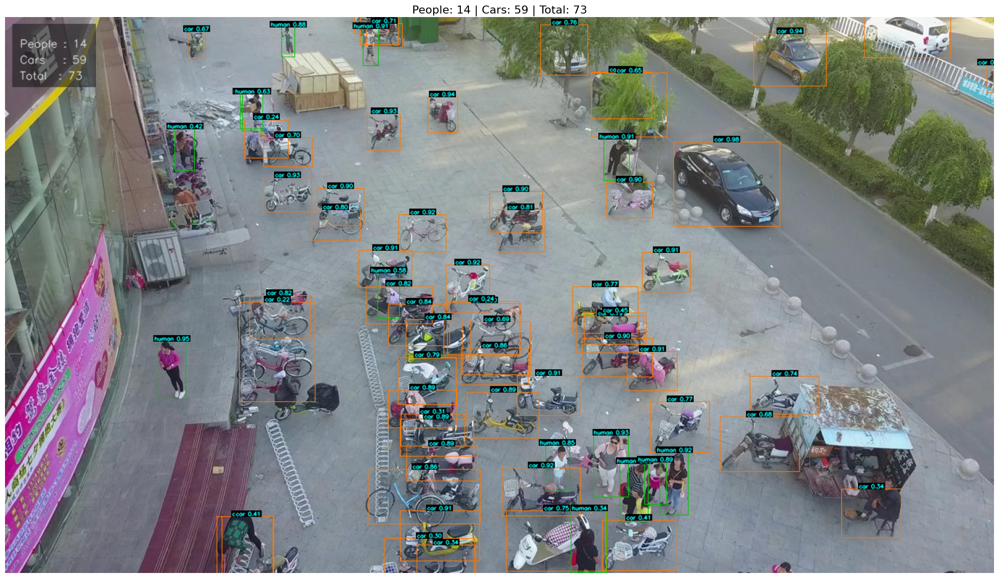

Result → People: 14  Cars: 59  Total: 73


In [9]:
counter = ObjectCounter(model_path=MODEL_PATH)

image_counts = counter(
    image_path     = IMAGE_PATH,
    cfg            = pred_cfg,
    save_path      = str(OUTPUT_DIR / "counted_image.jpg"),
    display = True,
)

print(f"Result → People: {image_counts['people']}  "
      f"Cars: {image_counts['cars']}  "
      f"Total: {image_counts['total']}")

*****
# Object Tracker Wrapper

In [6]:
class ObjectTracker:
    """
    Wrapper for YOLO26l-OBB inference + BoT-SORT tracking on VIDEO.

    BoT-SORT algorithm steps (per frame)
    -------------------------------------
    1. YOLO detects objects → OBB boxes + class + confidence
    2. sv.Detections.from_ultralytics() parses results
    3. Ultralytics BoT-SORT (botsort.yaml + persist=True):
        a. Kalman filter predicts each track's new position
        b. Camera Motion Compensation corrects for drone movement
        c. Two-stage Hungarian matching (high-conf first, then low-conf)
        d. Optional Re-ID embedding for long-occlusion recovery
        e. Track lifecycle: tentative → confirmed → lost → dead
    4. Track IDs surface in detections.tracker_id (via supervision)
    5. sv annotators draw OBBs + labels + HUD 
    6. sv.VideoSink writes frames

    Counting logic
    --------------
    PEOPLE → tracked with BoT-SORT; unique track IDs counted once for the
            whole video, regardless of re-appearances.
    CARS   → per-frame count (no tracking needed; mostly stationary in drone view).
    """
    def __init__(self, model_path: str):
        self.model = YOLO(model_path)
        self.seen_person_ids: set = set()  # to track unique people across frames
        self.total_cars: int = 0
        self.box_annotator = sv.OrientedBoxAnnotator(color=PALETTE,thickness=1,)
        self.label_annotator = sv.LabelAnnotator(
            color=sv.Color.from_hex("#00000000"),   
            text_color=sv.Color.from_hex("#00FFFF"),
            text_scale=0.25,
            text_thickness=1,
            text_padding=1,
            text_position=sv.Position.TOP_CENTER,
        )
        self.trace_annotator = sv.TraceAnnotator(
            color=PALETTE,
            position=sv.Position.CENTER,
            trace_length=30,
            thickness=2,
        )

    def _reset(self):
        """ clear counters before each video run """
        self.seen_person_ids.clear()
        self.total_cars = 0
    
    def _make_labels(self, detections: sv.Detections):
        """ 
        Build label strings per detection.
        People get their BoT-SORT track ID: 'P#<id> <conf>'
        Cars get a simple label:            'car <conf>'
        """
        labels = []
        for id, conf, tid in zip(
            detections.class_id,
            detections.confidence,
            detections.tracker_id if detections.tracker_id is not None else [None] * len(detections)
        ):
            cls_id = int(id)
            if cls_id == HUMAN_ID:
                label = f"P#{tid} {conf:.2f}" if tid is not None else f"person {conf:.2f}"
            else:
                label = f"car {conf:.2f}"
            labels.append(label)
        return labels
    
    def _draw_hud(self, frame: np.ndarray, frame_people: int, frame_cars: int, total_people: int, total_cars: int):
        frame_lines = [
            "-- Current Frame --",
            f"Objects : {frame_people + frame_cars}",
            f"People  : {frame_people}",
            f"Cars    : {frame_cars}",
        ]
        video_lines = [
            "-- Whole Video --",
            f"Objects : {total_people + total_cars}",
            f"People  : {total_people}",
            f"Cars    : {total_cars}",
        ]

        font       = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.4
        thickness  = 1
        pad, lh, pw = 8, 20, 190
        ph = pad * 2 + lh * len(frame_lines) + pad

        # ── Left panel ────────────────────────────────────────────────
        x0 = 6  # small inset so rect+text are fully on-screen
        overlay = frame.copy()
        cv2.rectangle(overlay, (x0, 0), (x0 + pw, ph), (20, 20, 20), -1)
        cv2.addWeighted(overlay, 0.6, frame, 0.4, 0, frame)
        for i, line in enumerate(frame_lines):
            color = (180, 255, 180) if i == 0 else (255, 255, 255)  # BGR
            cv2.putText(frame, line, (x0 + pad, pad + (i + 1) * lh),
                        font, font_scale, color, thickness, cv2.LINE_AA)

        # ── Right panel ───────────────────────────────────────────────
        x1 = x0 + pw + 6
        overlay2 = frame.copy()
        cv2.rectangle(overlay2, (x1, 0), (x1 + pw, ph), (20, 20, 20), -1)
        cv2.addWeighted(overlay2, 0.6, frame, 0.4, 0, frame)
        for i, line in enumerate(video_lines):
            color = (255, 220, 180) if i == 0 else (255, 255, 255)  # BGR
            cv2.putText(frame, line, (x1 + pad, pad + (i + 1) * lh),
                        font, font_scale, color, thickness, cv2.LINE_AA)

        return frame

    def __call__(self, video_path: str, cfg: dict, save_path: str = None, display: str = "window", display_every_n: int = 30):
        """ Run BoT-SORT tracking on a video file. """
        self._reset()
        video_info = sv.VideoInfo.from_video_path(video_path)
        print(
            f"[DroneTracker] Video: {video_info.width}×{video_info.height} "
            f"@ {video_info.fps:.1f}fps  |  {video_info.total_frames} frames"
        )

        frame_idx = 0
        sink_ctx = (sv.VideoSink(save_path, video_info=video_info) if save_path else _NullSink())

        with sink_ctx as sink:
            for frame in sv.get_video_frames_generator(video_path):
                frame_idx += 1

                # ── BoT-SORT tracking inference ────────────────────────────────
                # tracker="botsort.yaml" activates the full BoT-SORT algorithm:
                #   • Kalman filter state prediction
                #   • Camera Motion Compensation (ECC / sparse optical flow)
                #   • Two-stage Hungarian matching (high-conf → low-conf)
                #   • Re-ID embedding fusion
                #   • Track lifecycle (tentative / confirmed / lost / dead)
                # persist=True keeps tracker state alive across generator frames
                results = self.model.track(
                    source  = frame,
                    imgsz   = IMG_SIZE,
                    conf    = CONF_THRESH,
                    iou     = IOU_NMS,
                    tracker = "botsort.yaml",
                    persist = True,
                    verbose = False,
                )[0]

                detections = sv.Detections.from_ultralytics(results)
                people_mask = detections.class_id == HUMAN_ID
                car_mask    = detections.class_id == CAR_ID

                frame_people = int(people_mask.sum())
                frame_cars   = int(car_mask.sum())

                # register unique person track IDs for whole-video counting
                if detections.tracker_id is not None:
                    person_ids = detections.tracker_id[people_mask]
                    self.seen_person_ids.update(person_ids.tolist())

                self.total_cars += frame_cars

                # annotate frame
                labels = self._make_labels(detections)
                # TraceAnnotator requires tracker_id — skip on early frames
                # where BoT-SORT hasn't confirmed any tracks yet
                if detections.tracker_id is not None:
                    frame = self.trace_annotator.annotate(scene=frame, detections=detections)
                frame = self.box_annotator.annotate(scene=frame, detections=detections)
                frame = self.label_annotator.annotate(scene=frame, detections=detections, labels=labels)

                # draw hud
                frame = self._draw_hud(
                    frame,
                    frame_people = frame_people,
                    frame_cars   = frame_cars,
                    total_people = len(self.seen_person_ids),
                    total_cars   = self.total_cars,
                )

                # write to output
                sink.write_frame(frame)

                # window or inline
                if display == "window":
                    show_frame(frame, window_name=WINDOW_NAME)
                    if not IS_COLAB:
                        key = cv2.waitKey(1) & 0xFF
                        if key == ord("q") or key == 27:   # Q or Esc
                            print("[DroneTracker] Stopped by user (Q/Esc)")
                            break
                
                elif display == "inline" and frame_idx % display_every_n == 0:
                    # Inline Jupyter/Colab display every N frames.
                    rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    plt.figure(figsize=(20, 12))
                    plt.imshow(rgb)
                    plt.axis("off")
                    plt.title(
                        f"Frame {frame_idx}/{video_info.total_frames}  |  "
                        f"In frame → People: {frame_people}  Cars: {frame_cars}  |  "
                        f"Video total → People: {len(self.seen_person_ids)}  "
                        f"Cars: {self.total_cars}"
                    )
                    plt.tight_layout()
                    plt.show()
        
        if save_path:
            print(f"[Info] Output video saved to: {save_path}")
        
        if display == "window" and not IS_COLAB:
            cv2.destroyAllWindows(WINDOW_NAME)

        final = {
            "total_people"  : len(self.seen_person_ids),
            "total_cars"    : self.total_cars,
            "total_objects" : len(self.seen_person_ids) + self.total_cars,
        }
        print("\n[Video Summary]")
        print(f"  Unique people tracked : {final['total_people']}")
        print(f"  Total car detections  : {final['total_cars']}")
        print(f"  Total objects         : {final['total_objects']}")
        return final


class _NullSink:
    """
    No-op context manager used when save_path is None.
    Lets the main loop always call sink.write_frame() without branching.
    """
    def __enter__(self): return self
    def __exit__(self, *_): pass
    def write_frame(self, _): pass

[DroneTracker] Video: 1920×1080 @ 25.0fps  |  92 frames


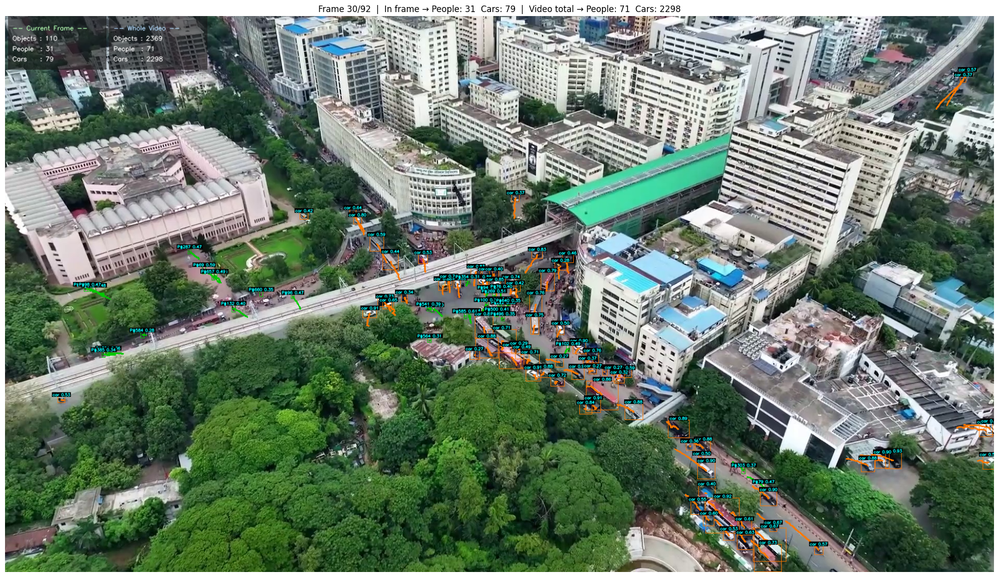

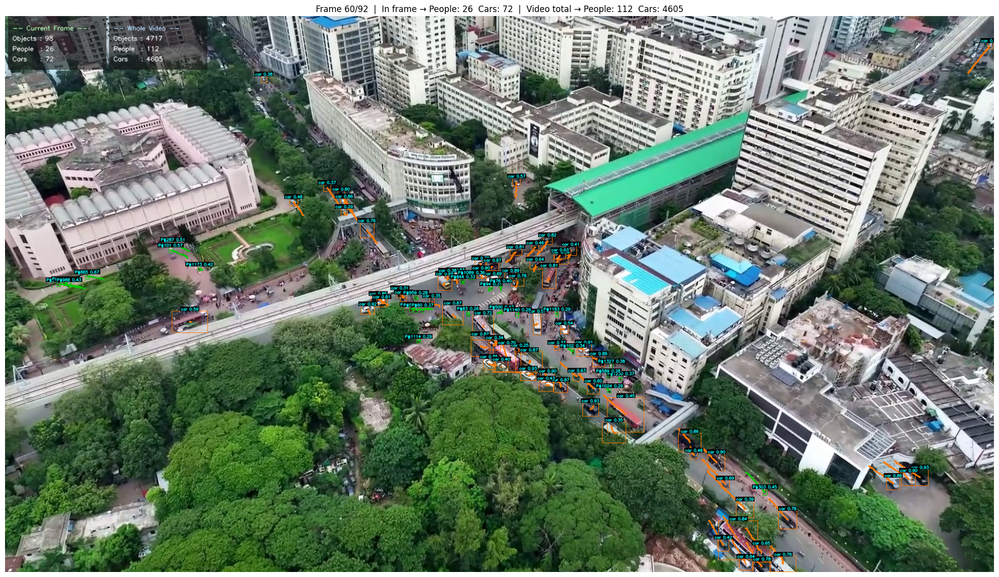

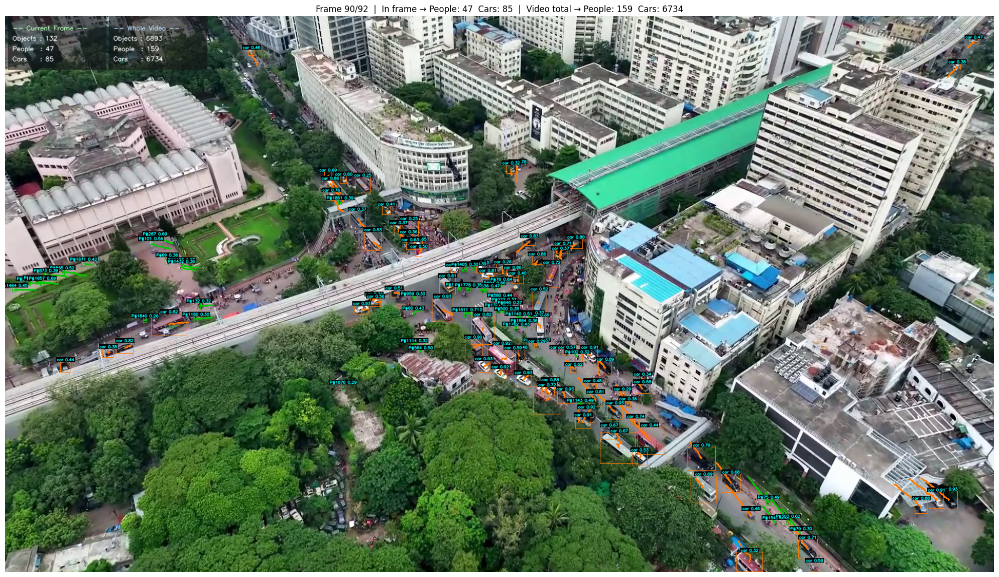

[Info] Output video saved to: outputs\tracked_video.mp4

[Video Summary]
  Unique people tracked : 165
  Total car detections  : 6913
  Total objects         : 7078

Final → People: 165  Cars: 6913  Total: 7078


In [7]:
tracker = ObjectTracker(model_path=MODEL_PATH)

video_counts = tracker(
    video_path      = VIDEO_PATH,
    cfg             = pred_cfg,
    save_path       = str(OUTPUT_DIR / "tracked_video.mp4"),
    display         = DISPLAY_MODE,      # "window" or "inline" — set in Config cell
    display_every_n = DISPLAY_EVERY_N,   # only used in inline mode
)

print(f"\nFinal → People: {video_counts['total_people']}  "
      f"Cars: {video_counts['total_cars']}  "
      f"Total: {video_counts['total_objects']}")